In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from glob import glob
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt, log10
import os
import re

### Image Preprocessing

In [ ]:
def preprocess_image(image_path):
    image = cv2.imread(image_path)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    return image, hsv

### Object Segmentation and Extract Features

In [ ]:
def segment_and_extract_features(image, hsv):
    lower_yellow = np.array([20, 100, 100])
    upper_yellow = np.array([30, 255, 255])
    mask_yellow = cv2.inRange(hsv, lower_yellow, upper_yellow)

    # Morphological operations
    kernel = np.ones((5, 5), np.uint8)
    mask_yellow = cv2.morphologyEx(mask_yellow, cv2.MORPH_CLOSE, kernel)
    mask_yellow = cv2.morphologyEx(mask_yellow, cv2.MORPH_OPEN, kernel)

    result = cv2.bitwise_and(image, image, mask=mask_yellow)

    # Sharpening the result
    sharpening_kernel = np.array([[0, -1, 0],
                                  [-1, 5, -1],
                                  [0, -1, 0]])
    sharpened = cv2.filter2D(result, -1, sharpening_kernel)

    return mask_yellow, result, sharpened

### Watershed

In [ ]:
def apply_watershed(image, mask):
    blurred = cv2.GaussianBlur(mask, (5, 5), 0)
    ret, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((3, 3), np.uint8)
    sure_bg = cv2.dilate(binary, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(binary, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    markers = cv2.watershed(image, markers)
    image[markers == -1] = [255, 0, 0]
    return image, markers

### Filter Contours

In [ ]:
def filter_contours(contours):
    filtered_contours = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > 1500:  # Increased area threshold to avoid small internal contours
            perimeter = cv2.arcLength(contour, True)
            circularity = 4 * np.pi * (area / (perimeter ** 2)) if perimeter != 0 else 0
            x, y, w, h = cv2.boundingRect(contour)
            aspect_ratio = float(w) / h  # Width to height ratio of the bounding box
            
            # Check for circularity and aspect ratio to eliminate non-lemon objects
            if 0.7 < circularity < 1.2 and 0.8 < aspect_ratio < 1.2:
                filtered_contours.append(contour)
    
    return filtered_contours

def remove_nested_contours(contours):
    # Remove smaller contours that are inside larger ones
    non_nested_contours = []
    for i, contour in enumerate(contours):
        x, y, w, h = cv2.boundingRect(contour)
        nested = False
        for j, other_contour in enumerate(contours):
            if i != j:
                ox, oy, ow, oh = cv2.boundingRect(other_contour)
                if (x > ox and y > oy and x + w < ox + ow and y + h < oy + oh):
                    nested = True
                    break
        if not nested:
            non_nested_contours.append(contour)
    return non_nested_contours

### Object Counting

In [ ]:
def count_lemons_combined(image, mask, markers):
    # Counting using Hough Circle Transform
    circles = cv2.HoughCircles(mask, cv2.HOUGH_GRADIENT, dp=1.2, minDist=20,
                               param1=50, param2=30, minRadius=10, maxRadius=60)
    
    lemon_count_hough = 0
    hough_positions = set()
    if circles is not None:
        circles = np.round(circles[0, :]).astype("int")
        for (x, y, r) in circles:
            cv2.circle(image, (x, y), r, (0, 255, 0), 4)
            lemon_count_hough += 1
            hough_positions.add((x, y))

    # Counting using Watershed (number of unique markers minus background and unknown)
    unique_markers = np.unique(markers)
    lemon_count_watershed = 0
    for marker in unique_markers:
        if marker > 1:  # Ignore background and unknown markers
            mask_area = np.where(markers == marker, 1, 0)
            mask_area = np.uint8(mask_area)
            x, y, w, h = cv2.boundingRect(mask_area)
            center = (x + w // 2, y + h // 2)
            if center not in hough_positions:
                lemon_count_watershed += 1
                cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 0), 2)

    # Combine the counts (add the unique detections)
    lemon_count_combined = lemon_count_hough + lemon_count_watershed

    return lemon_count_combined

### Visualization

In [ ]:
def process_and_compare(image_path, ground_truth_count=None):
    image, hsv = preprocess_image(image_path)
    mask_yellow, _, _ = segment_and_extract_features(image, hsv)
    watershed_image, markers = apply_watershed(image, mask_yellow)

    contours, _ = cv2.findContours(markers.astype(np.uint8), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
    filtered_contours = filter_contours(contours)
    non_nested_contours = remove_nested_contours(filtered_contours)

    # Draw contours on the image
    for contour in non_nested_contours:
        cv2.drawContours(image, [contour], -1, (0, 255, 0), 2)

    # Count lemons using the combined method
    lemon_count = count_lemons_combined(image, mask_yellow, markers)

    plt.figure(figsize=(10, 5))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f"Detected Lemons: {lemon_count}")
    plt.axis("off")
    plt.show()

    if ground_truth_count is not None:
        mse = mean_squared_error([ground_truth_count], [lemon_count])
        rmse = sqrt(mse)
        mae = mean_absolute_error([ground_truth_count], [lemon_count])
        psnr = 20 * log10(255 / sqrt(mse)) if mse != 0 else 100

        print(f"Detected Lemons: {lemon_count}")
        print(f"RMSE: {rmse:.2f}, MSE: {mse:.2f}, MAE: {mae:.2f}, PSNR: {psnr:.2f} dB")

        return lemon_count, rmse, mse, mae, psnr

    return lemon_count, None, None, None, None

### Data Output

In [ ]:
def process_all_images(image_folder, ground_truth_counts=None):
    # Only consider .jpeg files and sort them numerically based on the number in the filename
    image_paths = sorted(
        glob(f"{image_folder}/*.jpeg"),
        key=lambda x: int(re.search(r'images(\d+)', os.path.basename(x)).group(1))
    )
    results = []

    total_rmse = 0
    total_mse = 0
    total_mae = 0
    total_psnr = 0
    count = 0

    for i, image_path in enumerate(image_paths):
        ground_truth_count = ground_truth_counts[i] if ground_truth_counts is not None else None
        print(f"Processing {image_path}...")
        lemon_count, rmse, mse, mae, psnr = process_and_compare(image_path, ground_truth_count)
        if rmse is not None:
            total_rmse += rmse
            total_mse += mse
            total_mae += mae
            total_psnr += psnr
            count += 1
        results.append((image_path, ground_truth_count, lemon_count))

    # Output the results
    for result in results:
        image_path, ground_truth_count, lemon_count = result
        if ground_truth_count is not None:
            print(f"Image: {image_path}, Ground Truth: {ground_truth_count}, Detected: {lemon_count}")
        else:
            print(f"Image: {image_path}, Detected: {lemon_count}")

    if count > 0:
        avg_rmse = total_rmse / count
        avg_mse = total_mse / count
        avg_mae = total_mae / count
        avg_psnr = total_psnr / count

        print(f"\nAverage RMSE: {avg_rmse:.2f}")
        print(f"Average MSE: {avg_mse:.2f}")
        print(f"Average MAE: {avg_mae:.2f}")
        print(f"Average PSNR: {avg_psnr:.2f} dB")

### Testing and Validation

In [ ]:
# Example usage
image_folder = "Datasets/images"
ground_truth_counts = [6, 2, 3, 7, 24, 7, 1, 5, 3, 2, 3, 3, 3, 2, 2, 2, 4, 2, 3, 4, 3, 3, 5, 2, 3, 4, 5, 3, 4, 2, 4, 3, 3, 8, 5, 3, 2, 3, 5, 2, 5, 7, 6, 4, 4, 3, 6, 5, 7, 9]
process_all_images(image_folder, ground_truth_counts)

# ---------------------------------------------------------------------------

### User Interaction

In [ ]:
import cv2
import numpy as np
import os
import re
from glob import glob
import tkinter as tk
from tkinter import simpledialog

# Default global HSV values
default_hue_low = 20
default_hue_high = 30
default_saturation_low = 100
default_saturation_high = 255
default_value_low = 100
default_value_high = 255

# Variables to keep track of HSV values
hue_low = default_hue_low
hue_high = default_hue_high
saturation_low = default_saturation_low
saturation_high = default_saturation_high
value_low = default_value_low
value_high = default_value_high

# List to store image paths
image_paths = []

# Current image index
current_image_index = 0

def update_hsv_low(val):
    global hue_low, saturation_low, value_low
    hue_low = cv2.getTrackbarPos('Hue Low', 'Image')
    saturation_low = cv2.getTrackbarPos('Saturation Low', 'Image')
    value_low = cv2.getTrackbarPos('Value Low', 'Image')
    process_image()

def update_hsv_high(val):
    global hue_high, saturation_high, value_high
    hue_high = cv2.getTrackbarPos('Hue High', 'Image')
    saturation_high = cv2.getTrackbarPos('Saturation High', 'Image')
    value_high = cv2.getTrackbarPos('Value High', 'Image')
    process_image()

def process_image():
    global image_paths, current_image_index, hue_low, hue_high, saturation_low, saturation_high, value_low, value_high
    image = cv2.imread(image_paths[current_image_index])
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    lower_bound = np.array([hue_low, saturation_low, value_low])
    upper_bound = np.array([hue_high, saturation_high, value_high])
    mask = cv2.inRange(hsv, lower_bound, upper_bound)
    result = cv2.bitwise_and(image, image, mask=mask)
    
    # Resize the result image to fit the window
    resized_result = cv2.resize(result, (800, 600))
    
    # Add text instructions to the image
    add_help_text(resized_result)
    
    cv2.imshow('Image', resized_result)

def add_help_text(img):
    """Adds the key function instructions as overlay text on the image."""
    instructions = [
        "Press 'q' to Quit",
        "Press 'n' for Next Image",
        "Press 'p' for Previous Image",
        "Press 'i' to Input HSV values manually",
        "Press 'r' to Reset HSV values to default",
    ]
    
    y0, dy = 20, 30  # Starting position for the text and line spacing
    for i, line in enumerate(instructions):
        y = y0 + i * dy
        cv2.putText(img, line, (10, y), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2, cv2.LINE_AA)

def navigate_images(key):
    global current_image_index, image_paths
    if key == ord('n'):  # Next image
        current_image_index = (current_image_index + 1) % len(image_paths)
    elif key == ord('p'):  # Previous image
        current_image_index = (current_image_index - 1) % len(image_paths)
    process_image()

def reset_hsv_values():
    global hue_low, hue_high, saturation_low, saturation_high, value_low, value_high
    hue_low = default_hue_low
    hue_high = default_hue_high
    saturation_low = default_saturation_low
    saturation_high = default_saturation_high
    value_low = default_value_low
    value_high = default_value_high

    # Reset trackbars to default values
    cv2.setTrackbarPos('Hue Low', 'Image', hue_low)
    cv2.setTrackbarPos('Hue High', 'Image', hue_high)
    cv2.setTrackbarPos('Saturation Low', 'Image', saturation_low)
    cv2.setTrackbarPos('Saturation High', 'Image', saturation_high)
    cv2.setTrackbarPos('Value Low', 'Image', value_low)
    cv2.setTrackbarPos('Value High', 'Image', value_high)

    process_image()

def update_hsv_values_manually():
    global hue_low, hue_high, saturation_low, saturation_high, value_low, value_high

    # Create a simple Tkinter input dialog for each HSV parameter
    root = tk.Tk()
    root.withdraw()  # Hide the main Tkinter window

    try:
        hue_low = int(simpledialog.askstring("Input", "Enter Hue Low value (0-179):", parent=root))
        hue_high = int(simpledialog.askstring("Input", "Enter Hue High value (0-179):", parent=root))
        saturation_low = int(simpledialog.askstring("Input", "Enter Saturation Low value (0-255):", parent=root))
        saturation_high = int(simpledialog.askstring("Input", "Enter Saturation High value (0-255):", parent=root))
        value_low = int(simpledialog.askstring("Input", "Enter Value Low value (0-255):", parent=root))
        value_high = int(simpledialog.askstring("Input", "Enter Value High value (0-255):", parent=root))
        process_image()
    except ValueError:
        print("Please enter valid integer values.")

def main():
    global image_paths, current_image_index

    image_folder = "Datasets/images"
    
    # Only consider .jpeg files and sort them numerically based on the number in the filename
    image_paths = sorted(
        glob(f"{image_folder}/*.jpeg"),
        key=lambda x: int(re.search(r'images(\d+)', os.path.basename(x)).group(1))
    )

    if not image_paths:
        print("No images found.")
        return

    # Create a window and make it larger
    cv2.namedWindow('Image', cv2.WINDOW_NORMAL)
    cv2.resizeWindow('Image', 800, 600)
    
    # Create trackbars (optional: can still be used alongside manual input)
    cv2.createTrackbar('Hue Low', 'Image', hue_low, 179, update_hsv_low)
    cv2.createTrackbar('Hue High', 'Image', hue_high, 179, update_hsv_high)
    cv2.createTrackbar('Saturation Low', 'Image', saturation_low, 255, update_hsv_low)
    cv2.createTrackbar('Saturation High', 'Image', saturation_high, 255, update_hsv_high)
    cv2.createTrackbar('Value Low', 'Image', value_low, 255, update_hsv_low)
    cv2.createTrackbar('Value High', 'Image', value_high, 255, update_hsv_high)

    process_image()

    while True:
        key = cv2.waitKey(0)
        if key == ord('q'):  # Quit the loop
            break
        elif key == ord('n') or key == ord('p'):  # Navigate images
            navigate_images(key)
        elif key == ord('i'):  # Input manual HSV values using the text box
            update_hsv_values_manually()
        elif key == ord('r'):  # Reset HSV values to default
            reset_hsv_values()

    cv2.destroyAllWindows()

if __name__ == "__main__":
    main()


# ---------------------------------------------------------------------------

Processing Datasets/images\images1.jpeg...


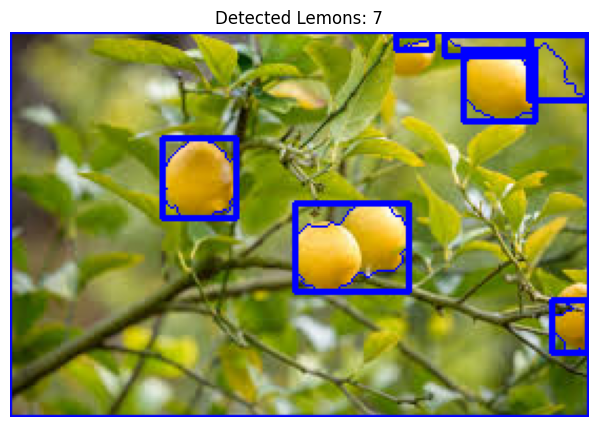

Detected Lemons: 7
RMSE: 1.00, MSE: 1.00, MAE: 1.00, PSNR: 6.74 dB
Processing Datasets/images\images2.jpeg...


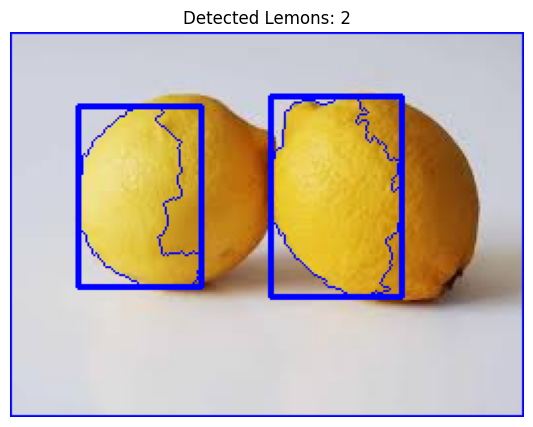

Detected Lemons: 2
RMSE: 0.00, MSE: 0.00, MAE: 0.00, PSNR: 3.18 dB
Processing Datasets/images\images3.jpeg...


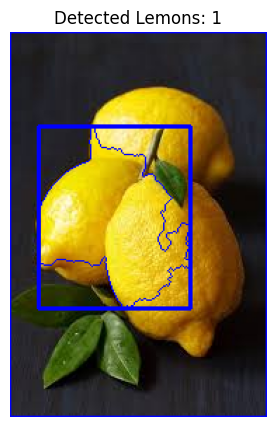

Detected Lemons: 1
RMSE: 2.00, MSE: 4.00, MAE: 2.00, PSNR: 11.57 dB
Processing Datasets/images\images4.jpeg...


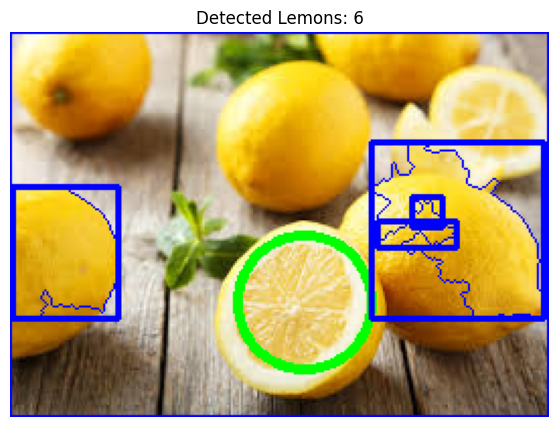

Detected Lemons: 6
RMSE: 1.00, MSE: 1.00, MAE: 1.00, PSNR: 5.67 dB
Processing Datasets/images\images5.jpeg...


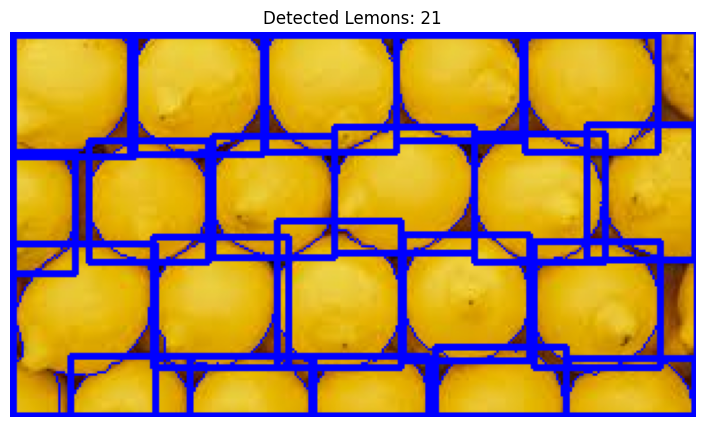

Detected Lemons: 21
RMSE: 3.00, MSE: 9.00, MAE: 3.00, PSNR: 6.87 dB
Processing Datasets/images\images6.jpeg...


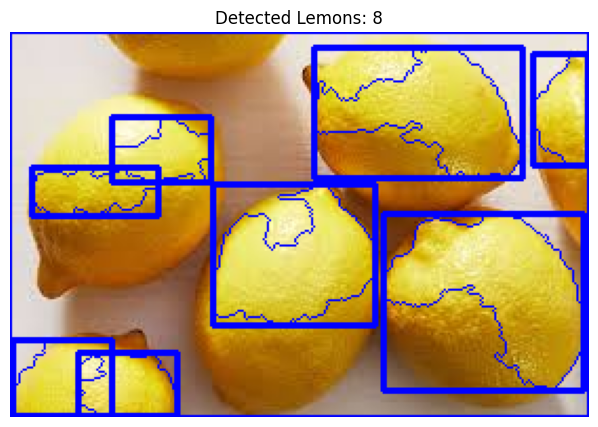

Detected Lemons: 8
RMSE: 1.00, MSE: 1.00, MAE: 1.00, PSNR: 5.53 dB
Processing Datasets/images\images7.jpeg...


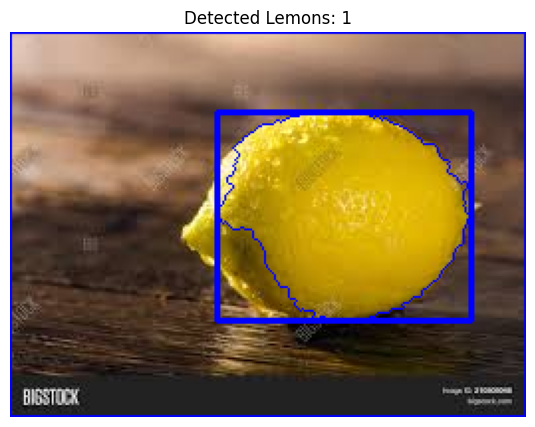

Detected Lemons: 1
RMSE: 0.00, MSE: 0.00, MAE: 0.00, PSNR: 8.62 dB
Processing Datasets/images\images8.jpeg...


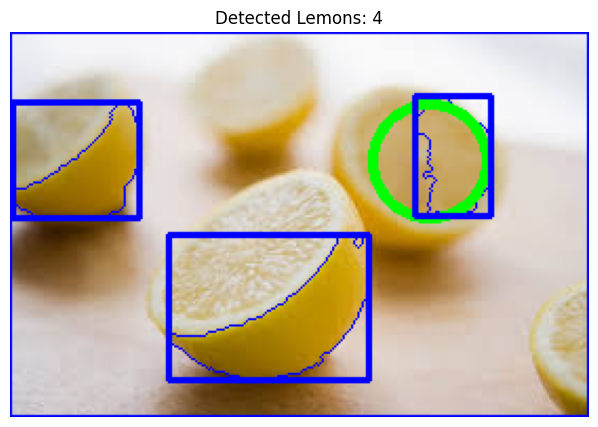

Detected Lemons: 4
RMSE: 1.00, MSE: 1.00, MAE: 1.00, PSNR: 2.86 dB
Processing Datasets/images\images9.jpeg...


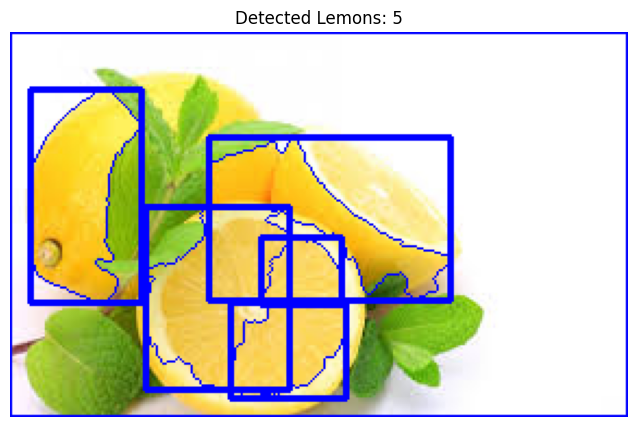

Detected Lemons: 5
RMSE: 2.00, MSE: 4.00, MAE: 2.00, PSNR: 2.35 dB
Processing Datasets/images\images10.jpeg...


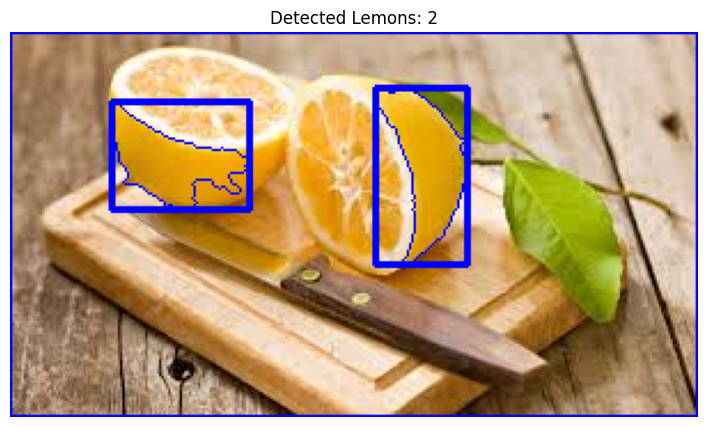

Detected Lemons: 2
RMSE: 0.00, MSE: 0.00, MAE: 0.00, PSNR: 4.23 dB
Processing Datasets/images\images11.jpeg...


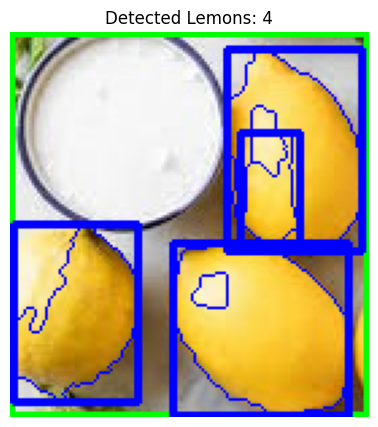

Detected Lemons: 4
RMSE: 1.00, MSE: 1.00, MAE: 1.00, PSNR: 4.10 dB
Processing Datasets/images\images12.jpeg...


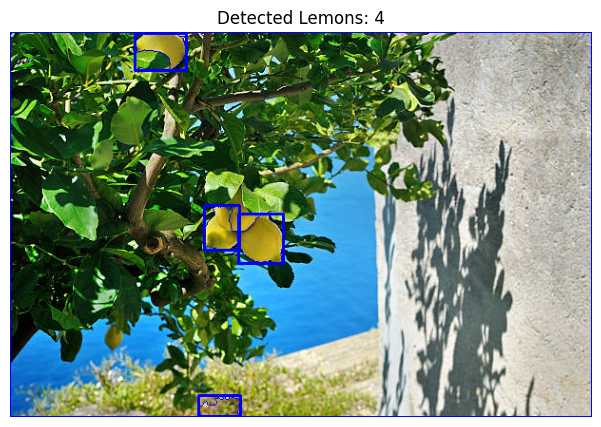

Detected Lemons: 4
RMSE: 1.00, MSE: 1.00, MAE: 1.00, PSNR: 5.41 dB
Processing Datasets/images\images13.jpeg...


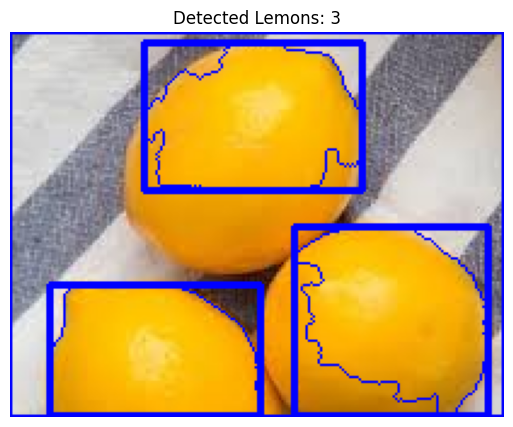

Detected Lemons: 3
RMSE: 0.00, MSE: 0.00, MAE: 0.00, PSNR: 5.36 dB
Processing Datasets/images\images14.jpeg...


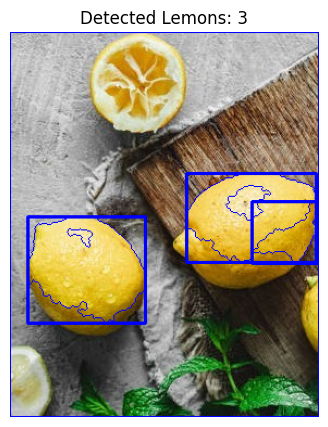

Detected Lemons: 3
RMSE: 1.00, MSE: 1.00, MAE: 1.00, PSNR: 5.89 dB
Processing Datasets/images\images15.jpeg...


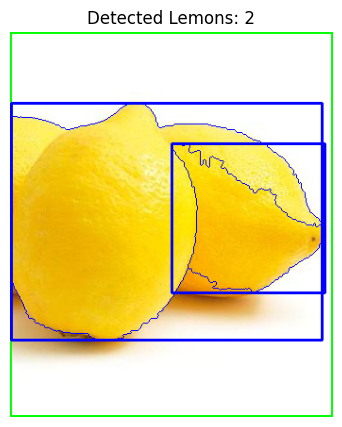

Detected Lemons: 2
RMSE: 0.00, MSE: 0.00, MAE: 0.00, PSNR: 2.74 dB
Processing Datasets/images\images16.jpeg...


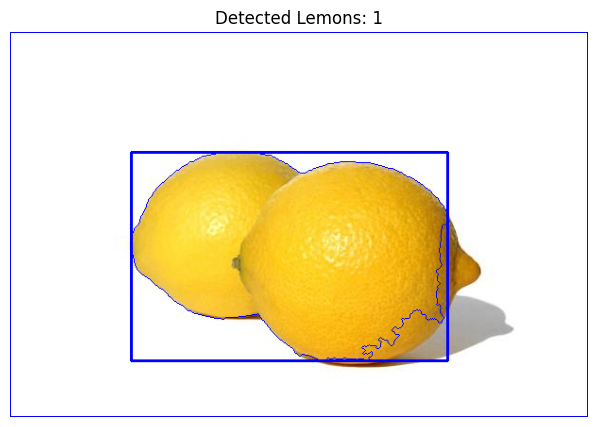

Detected Lemons: 1
RMSE: 1.00, MSE: 1.00, MAE: 1.00, PSNR: 1.23 dB
Processing Datasets/images\images17.jpeg...


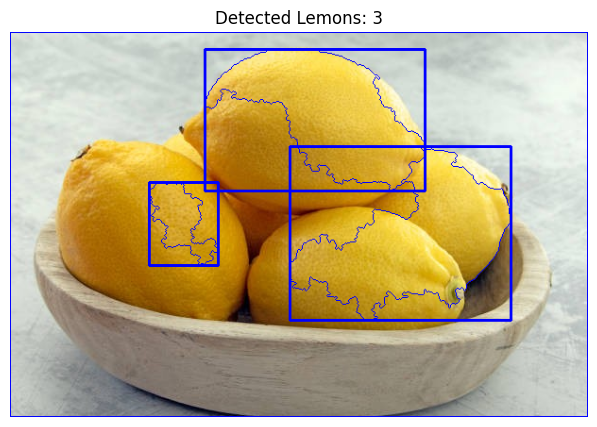

Detected Lemons: 3
RMSE: 1.00, MSE: 1.00, MAE: 1.00, PSNR: 4.24 dB
Processing Datasets/images\images18.jpeg...


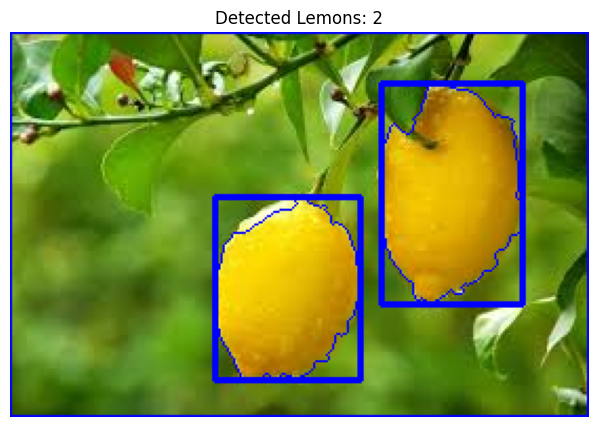

Detected Lemons: 2
RMSE: 0.00, MSE: 0.00, MAE: 0.00, PSNR: 7.83 dB
Processing Datasets/images\images19.jpeg...


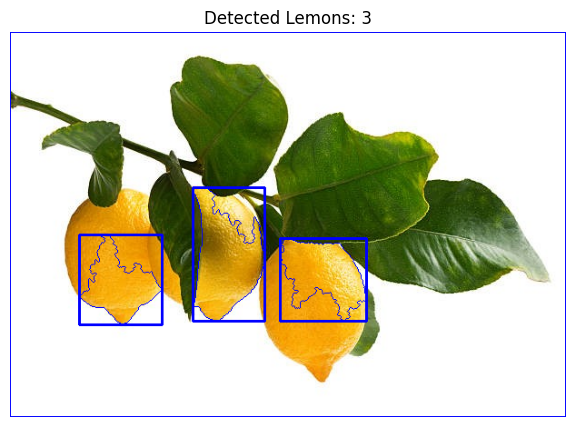

Detected Lemons: 3
RMSE: 0.00, MSE: 0.00, MAE: 0.00, PSNR: 1.85 dB
Processing Datasets/images\images20.jpeg...


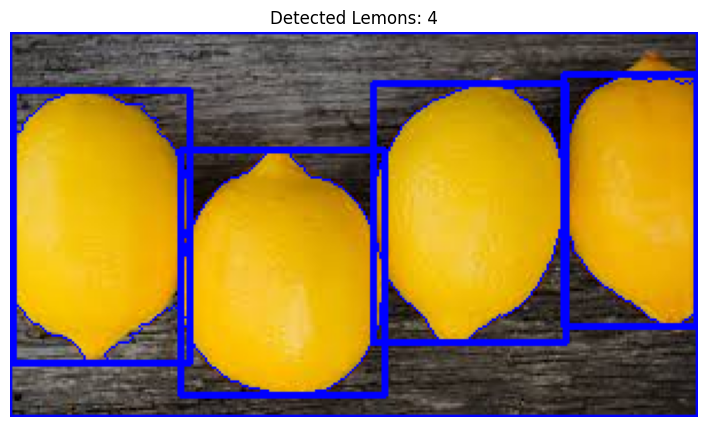

Detected Lemons: 4
RMSE: 0.00, MSE: 0.00, MAE: 0.00, PSNR: 9.75 dB
Processing Datasets/images\images21.jpeg...


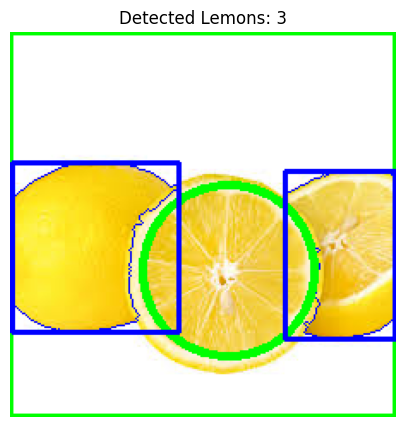

Detected Lemons: 3
RMSE: 0.00, MSE: 0.00, MAE: 0.00, PSNR: 2.24 dB
Processing Datasets/images\images22.jpeg...


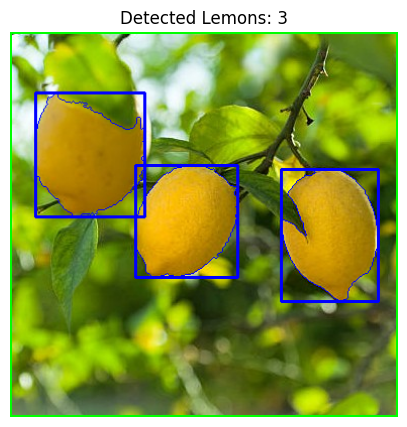

Detected Lemons: 3
RMSE: 0.00, MSE: 0.00, MAE: 0.00, PSNR: 7.03 dB
Processing Datasets/images\images23.jpeg...


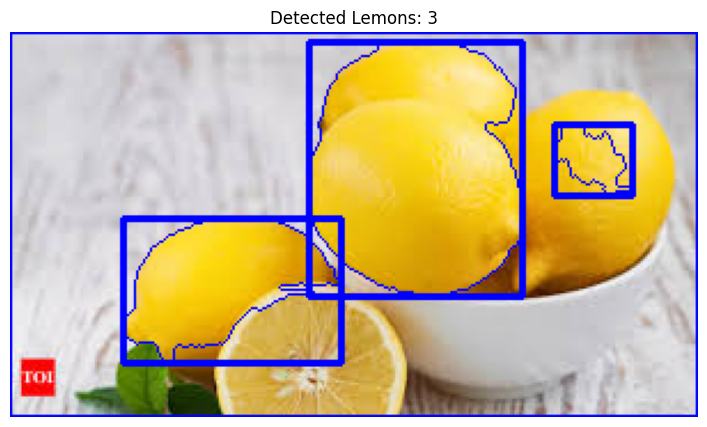

Detected Lemons: 3
RMSE: 2.00, MSE: 4.00, MAE: 2.00, PSNR: 4.05 dB
Processing Datasets/images\images24.jpeg...


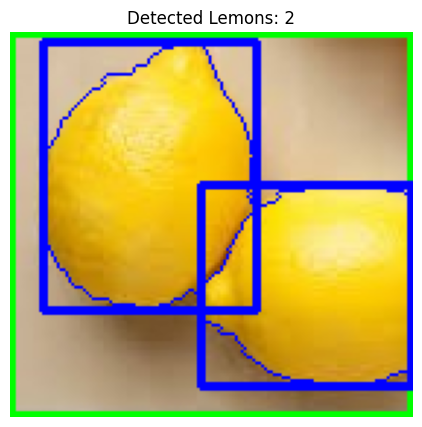

Detected Lemons: 2
RMSE: 0.00, MSE: 0.00, MAE: 0.00, PSNR: 5.90 dB
Processing Datasets/images\images25.jpeg...


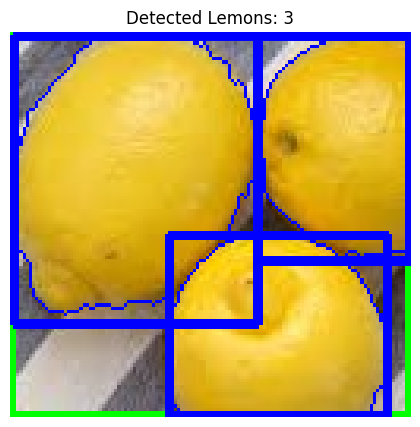

Detected Lemons: 3
RMSE: 0.00, MSE: 0.00, MAE: 0.00, PSNR: 7.44 dB
Processing Datasets/images\images26.jpeg...


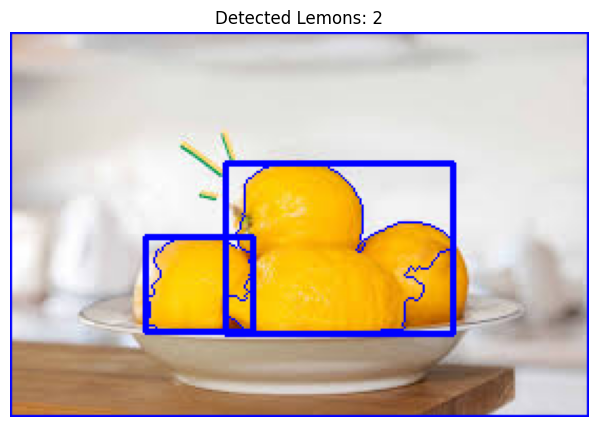

Detected Lemons: 2
RMSE: 2.00, MSE: 4.00, MAE: 2.00, PSNR: 2.63 dB
Processing Datasets/images\images27.jpeg...


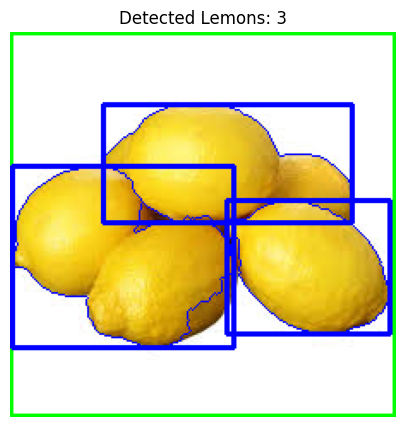

Detected Lemons: 3
RMSE: 2.00, MSE: 4.00, MAE: 2.00, PSNR: 2.38 dB
Processing Datasets/images\images28.jpeg...


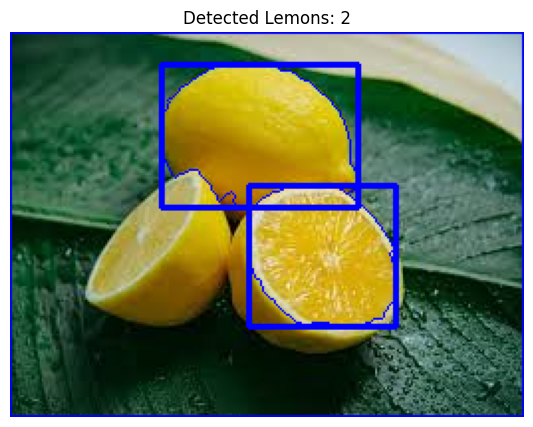

Detected Lemons: 2
RMSE: 1.00, MSE: 1.00, MAE: 1.00, PSNR: 8.65 dB
Processing Datasets/images\images29.jpeg...


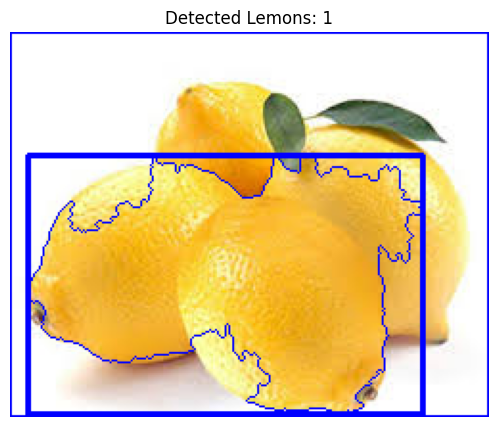

Detected Lemons: 1
RMSE: 3.00, MSE: 9.00, MAE: 3.00, PSNR: 3.28 dB
Processing Datasets/images\images30.jpeg...


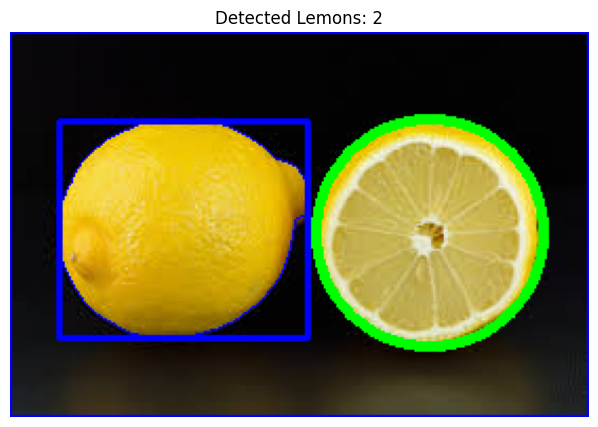

Detected Lemons: 2
RMSE: 0.00, MSE: 0.00, MAE: 0.00, PSNR: 12.39 dB
Processing Datasets/images\images31.jpeg...


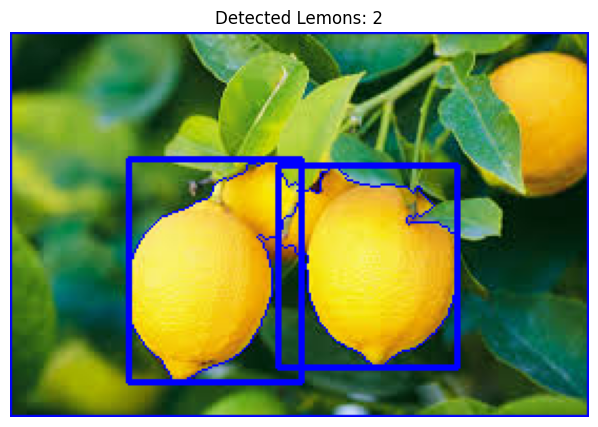

Detected Lemons: 2
RMSE: 2.00, MSE: 4.00, MAE: 2.00, PSNR: 8.70 dB
Processing Datasets/images\images32.jpeg...


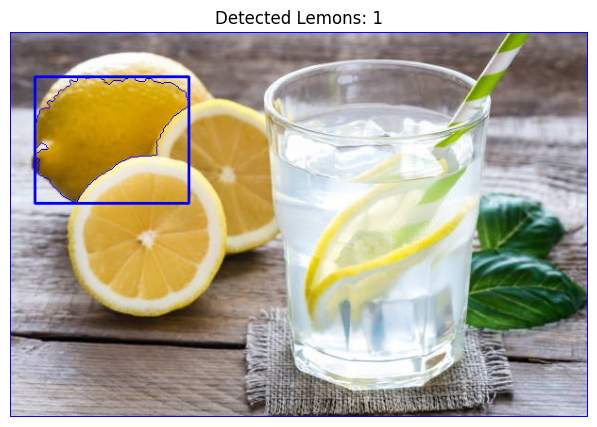

Detected Lemons: 1
RMSE: 2.00, MSE: 4.00, MAE: 2.00, PSNR: 4.06 dB
Processing Datasets/images\images33.jpeg...


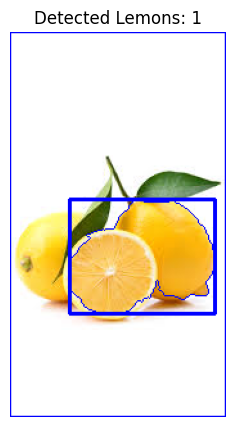

Detected Lemons: 1
RMSE: 2.00, MSE: 4.00, MAE: 2.00, PSNR: 1.21 dB
Processing Datasets/images\images34.jpeg...


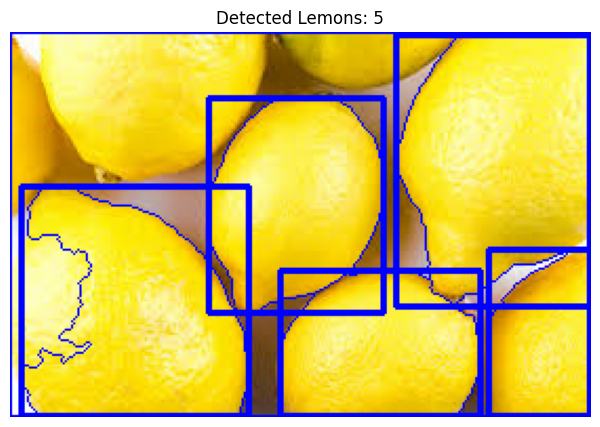

Detected Lemons: 5
RMSE: 3.00, MSE: 9.00, MAE: 3.00, PSNR: 8.23 dB
Processing Datasets/images\images35.jpeg...


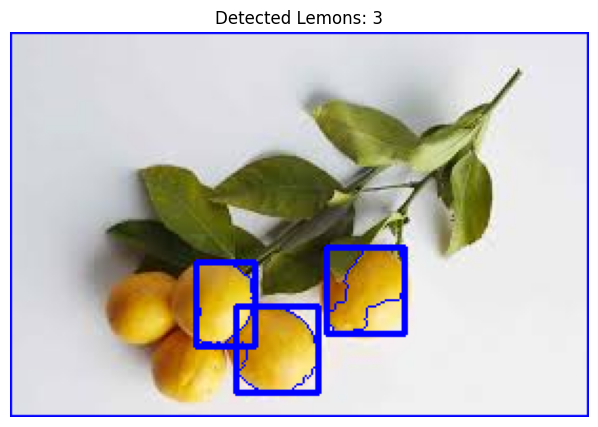

Detected Lemons: 3
RMSE: 2.00, MSE: 4.00, MAE: 2.00, PSNR: 2.39 dB
Processing Datasets/images\images36.jpeg...


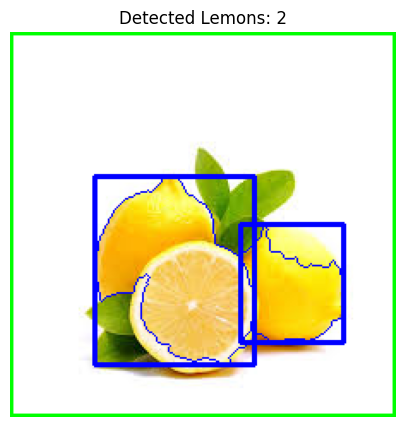

Detected Lemons: 2
RMSE: 1.00, MSE: 1.00, MAE: 1.00, PSNR: 1.36 dB
Processing Datasets/images\images37.jpeg...


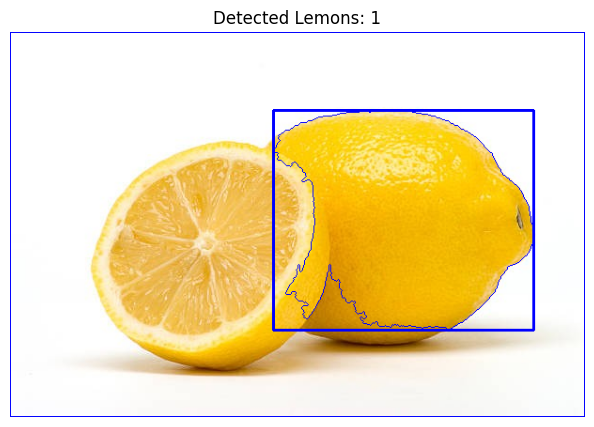

Detected Lemons: 1
RMSE: 1.00, MSE: 1.00, MAE: 1.00, PSNR: 2.04 dB
Processing Datasets/images\images38.jpeg...


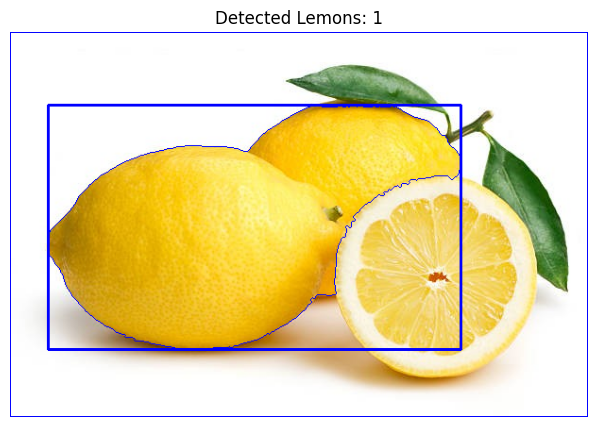

Detected Lemons: 1
RMSE: 2.00, MSE: 4.00, MAE: 2.00, PSNR: 2.48 dB
Processing Datasets/images\images39.jpeg...


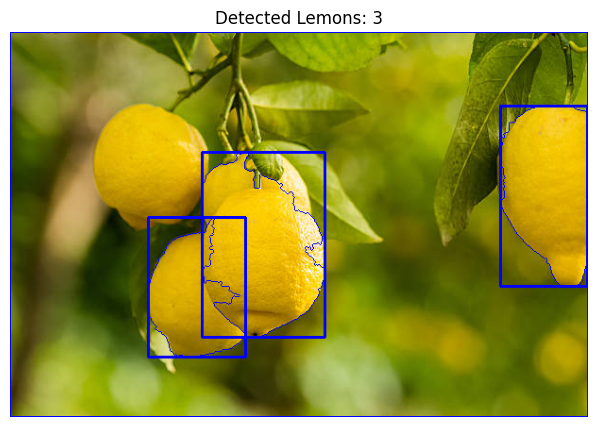

Detected Lemons: 3
RMSE: 2.00, MSE: 4.00, MAE: 2.00, PSNR: 8.46 dB
Processing Datasets/images\images40.jpeg...


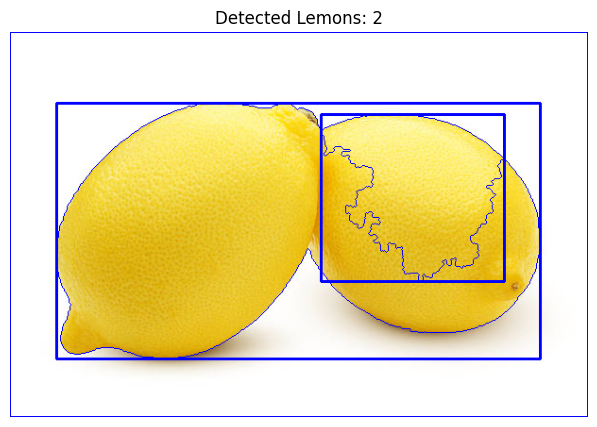

Detected Lemons: 2
RMSE: 0.00, MSE: 0.00, MAE: 0.00, PSNR: 2.43 dB
Processing Datasets/images\images41.jpeg...


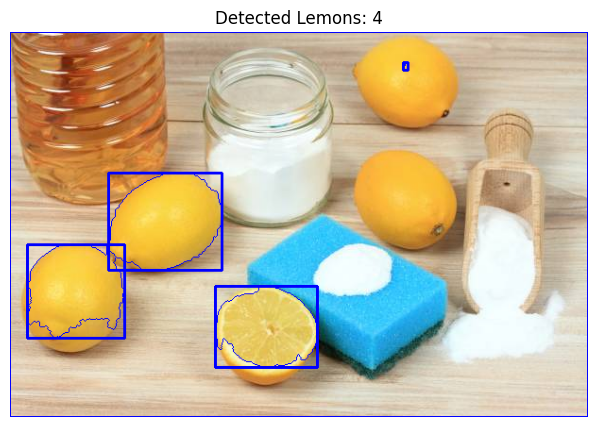

Detected Lemons: 4
RMSE: 1.00, MSE: 1.00, MAE: 1.00, PSNR: 3.26 dB
Processing Datasets/images\images42.jpeg...


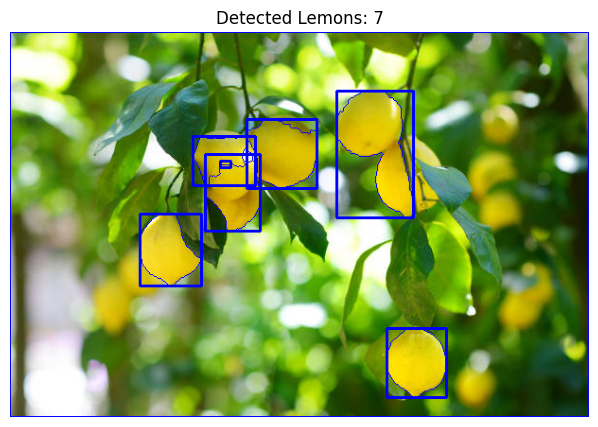

Detected Lemons: 7
RMSE: 0.00, MSE: 0.00, MAE: 0.00, PSNR: 6.14 dB
Processing Datasets/images\images43.jpeg...


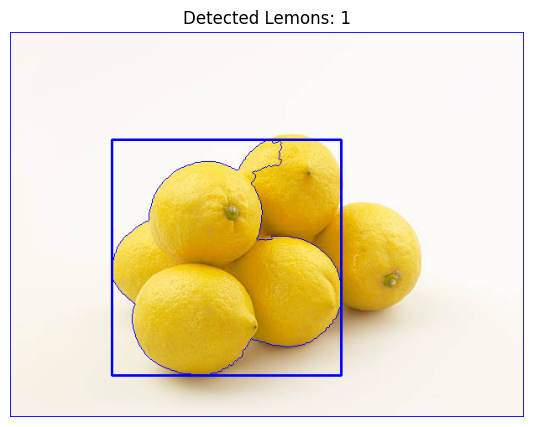

Detected Lemons: 1
RMSE: 5.00, MSE: 25.00, MAE: 5.00, PSNR: 1.57 dB
Processing Datasets/images\images44.jpeg...


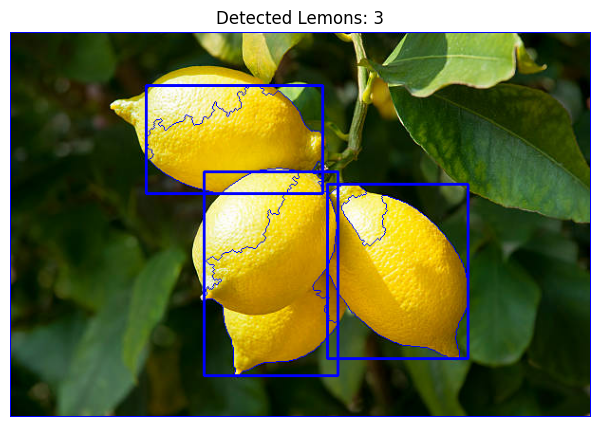

Detected Lemons: 3
RMSE: 1.00, MSE: 1.00, MAE: 1.00, PSNR: 10.88 dB
Processing Datasets/images\images45.jpeg...


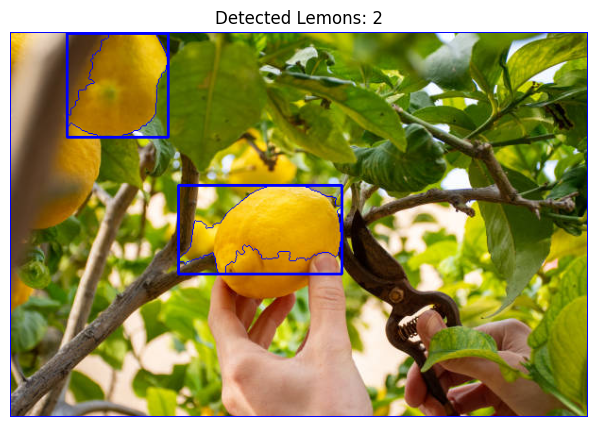

Detected Lemons: 2
RMSE: 2.00, MSE: 4.00, MAE: 2.00, PSNR: 6.72 dB
Processing Datasets/images\images46.jpeg...


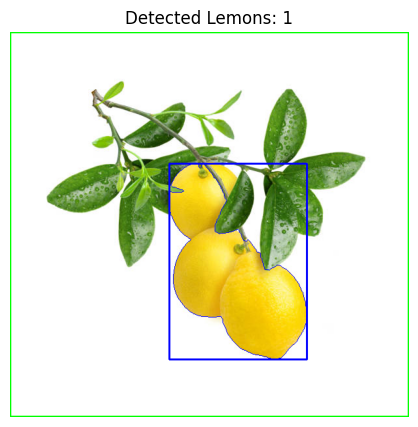

Detected Lemons: 1
RMSE: 2.00, MSE: 4.00, MAE: 2.00, PSNR: 1.07 dB
Processing Datasets/images\images47.jpeg...


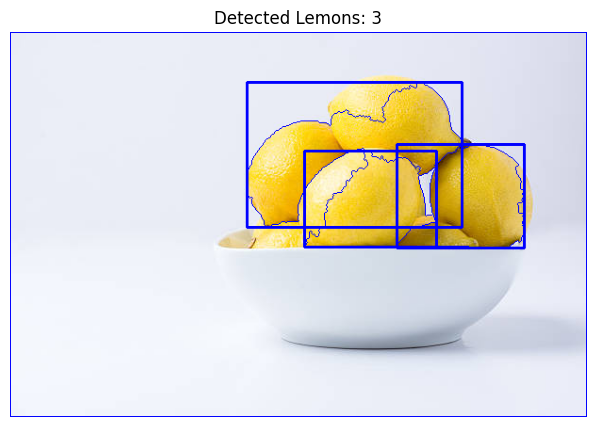

Detected Lemons: 3
RMSE: 3.00, MSE: 9.00, MAE: 3.00, PSNR: 1.35 dB
Processing Datasets/images\images48.jpeg...


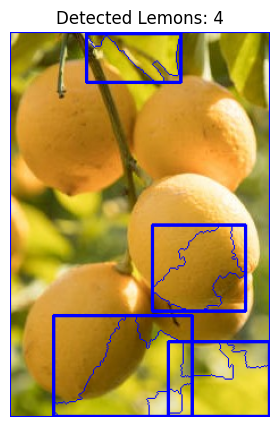

Detected Lemons: 4
RMSE: 1.00, MSE: 1.00, MAE: 1.00, PSNR: 6.28 dB
Processing Datasets/images\images49.jpeg...


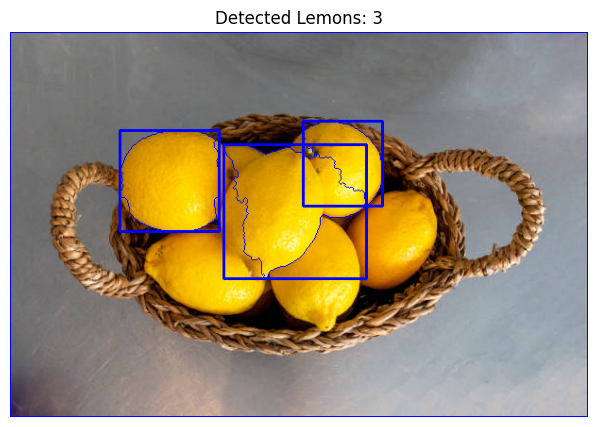

Detected Lemons: 3
RMSE: 4.00, MSE: 16.00, MAE: 4.00, PSNR: 6.23 dB
Processing Datasets/images\images50.jpeg...


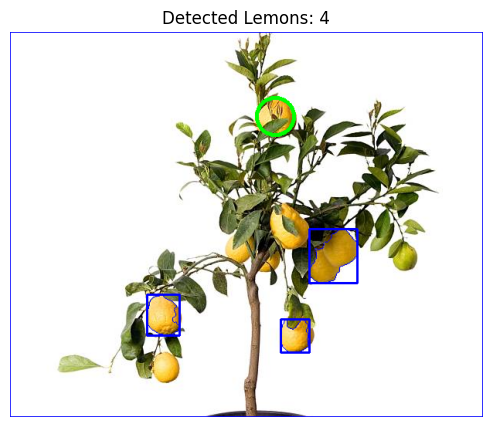

Detected Lemons: 4
RMSE: 5.00, MSE: 25.00, MAE: 5.00, PSNR: 0.84 dB
Image: Datasets/images\images1.jpeg, Ground Truth: 6, Detected: 7
Image: Datasets/images\images2.jpeg, Ground Truth: 2, Detected: 2
Image: Datasets/images\images3.jpeg, Ground Truth: 3, Detected: 1
Image: Datasets/images\images4.jpeg, Ground Truth: 7, Detected: 6
Image: Datasets/images\images5.jpeg, Ground Truth: 24, Detected: 21
Image: Datasets/images\images6.jpeg, Ground Truth: 7, Detected: 8
Image: Datasets/images\images7.jpeg, Ground Truth: 1, Detected: 1
Image: Datasets/images\images8.jpeg, Ground Truth: 5, Detected: 4
Image: Datasets/images\images9.jpeg, Ground Truth: 3, Detected: 5
Image: Datasets/images\images10.jpeg, Ground Truth: 2, Detected: 2
Image: Datasets/images\images11.jpeg, Ground Truth: 3, Detected: 4
Image: Datasets/images\images12.jpeg, Ground Truth: 3, Detected: 4
Image: Datasets/images\images13.jpeg, Ground Truth: 3, Detected: 3
Image: Datasets/images\images14.jpeg, Ground Truth: 2, Detected: 3
I

In [7]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from glob import glob
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt, log10
import os
import re

# Step 1: Image Preprocessing
def preprocess_image(image_path):
    image = cv2.imread(image_path)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    return image, hsv

def segment_and_extract_features(image, hsv):
    lower_yellow = np.array([20, 100, 100])
    upper_yellow = np.array([30, 255, 255])
    mask_yellow = cv2.inRange(hsv, lower_yellow, upper_yellow)

    # Morphological operations
    kernel = np.ones((5, 5), np.uint8)
    mask_yellow = cv2.morphologyEx(mask_yellow, cv2.MORPH_CLOSE, kernel)
    mask_yellow = cv2.morphologyEx(mask_yellow, cv2.MORPH_OPEN, kernel)

    result = cv2.bitwise_and(image, image, mask=mask_yellow)

    # Sharpening the result
    sharpening_kernel = np.array([[0, -1, 0],
                                  [-1, 5, -1],
                                  [0, -1, 0]])
    sharpened = cv2.filter2D(result, -1, sharpening_kernel)

    return mask_yellow, result, sharpened

def apply_watershed(image, mask):
    blurred = cv2.GaussianBlur(mask, (5, 5), 0)
    ret, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((3, 3), np.uint8)
    sure_bg = cv2.dilate(binary, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(binary, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    markers = cv2.watershed(image, markers)
    image[markers == -1] = [255, 0, 0]
    return image, markers

# Function to filter contours using hierarchy information
def filter_contours(contours, hierarchy):
    filtered_contours = []
    for i, contour in enumerate(contours):
        area = cv2.contourArea(contour)
        if area > 1500:  # Increased area threshold to avoid small internal contours
            perimeter = cv2.arcLength(contour, True)
            circularity = 4 * np.pi * (area / (perimeter ** 2)) if perimeter != 0 else 0
            x, y, w, h = cv2.boundingRect(contour)
            aspect_ratio = float(w) / h  # Width to height ratio of the bounding box
            
            # Check for circularity and aspect ratio to eliminate non-lemon objects
            if 0.7 < circularity < 1.2 and 0.8 < aspect_ratio < 1.2:
                # Check hierarchy: hierarchy[0][i][3] == -1 means it is not nested within another contour
                if hierarchy[0][i][3] == -1:  # Not a child contour
                    filtered_contours.append(contour)
    return filtered_contours

def count_lemons_combined(image, mask, markers):
    # Counting using Hough Circle Transform
    circles = cv2.HoughCircles(mask, cv2.HOUGH_GRADIENT, dp=1.2, minDist=20,
                               param1=50, param2=30, minRadius=10, maxRadius=60)
    
    lemon_count_hough = 0
    hough_positions = set()
    if circles is not None:
        circles = np.round(circles[0, :]).astype("int")
        for (x, y, r) in circles:
            cv2.circle(image, (x, y), r, (0, 255, 0), 4)
            lemon_count_hough += 1
            hough_positions.add((x, y))

    # Counting using Watershed (number of unique markers minus background and unknown)
    unique_markers = np.unique(markers)
    lemon_count_watershed = 0
    for marker in unique_markers:
        if marker > 1:  # Ignore background and unknown markers
            mask_area = np.where(markers == marker, 1, 0)
            mask_area = np.uint8(mask_area)
            x, y, w, h = cv2.boundingRect(mask_area)
            center = (x + w // 2, y + h // 2)
            if center not in hough_positions:
                lemon_count_watershed += 1
                cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 0), 2)

    # Combine the counts (add the unique detections)
    lemon_count_combined = lemon_count_hough + lemon_count_watershed

    return lemon_count_combined

def process_and_compare(image_path, ground_truth_count=None):
    image, hsv = preprocess_image(image_path)
    mask_yellow, _, _ = segment_and_extract_features(image, hsv)
    watershed_image, markers = apply_watershed(image, mask_yellow)

    contours, hierarchy = cv2.findContours(markers.astype(np.uint8), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
    filtered_contours = filter_contours(contours, hierarchy)

    # Draw contours on the image
    for contour in filtered_contours:
        cv2.drawContours(image, [contour], -1, (0, 255, 0), 2)

    # Count lemons using the combined method
    lemon_count = count_lemons_combined(image, mask_yellow, markers)

    plt.figure(figsize=(10, 5))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f"Detected Lemons: {lemon_count}")
    plt.axis("off")
    plt.show()

    if ground_truth_count is not None:
        mse = mean_squared_error([ground_truth_count], [lemon_count])
        rmse = sqrt(mse)
        mae = mean_absolute_error([ground_truth_count], [lemon_count])
        psnr = 20 * log10(255 / sqrt(mse)) if mse != 0 else 100

        print(f"Detected Lemons: {lemon_count}")
        print(f"RMSE: {rmse:.2f}, MSE: {mse:.2f}, MAE: {mae:.2f}, PSNR: {psnr:.2f} dB")

        return lemon_count, rmse, mse, mae, psnr

    return lemon_count, None, None, None, None

def process_all_images(image_folder, ground_truth_counts=None):
    # Only consider .jpeg files and sort them numerically based on the number in the filename
    image_paths = sorted(
        glob(f"{image_folder}/*.jpeg"),
        key=lambda x: int(re.search(r'images(\d+)', os.path.basename(x)).group(1))
    )
    results = []

    total_rmse = 0
    total_mse = 0
    total_mae = 0
    total_psnr = 0
    count = 0

    for i, image_path in enumerate(image_paths):
        ground_truth_count = ground_truth_counts[i] if ground_truth_counts is not None else None
        print(f"Processing {image_path}...")
        lemon_count, rmse, mse, mae, psnr = process_and_compare(image_path, ground_truth_count)
        if rmse is not None:
            total_rmse += rmse
            total_mse += mse
            total_mae += mae
            total_psnr += psnr
            count += 1
        results.append((image_path, ground_truth_count, lemon_count))

    # Output the results
    for result in results:
        image_path, ground_truth_count, lemon_count = result
        if ground_truth_count is not None:
            print(f"Image: {image_path}, Ground Truth: {ground_truth_count}, Detected: {lemon_count}")
        else:
            print(f"Image: {image_path}, Detected: {lemon_count}")

    if count > 0:
        avg_rmse = total_rmse / count
        avg_mse = total_mse / count
        avg_mae = total_mae / count
        avg_psnr = total_psnr / count

        print(f"\nAverage RMSE: {avg_rmse:.2f}")
        print(f"Average MSE: {avg_mse:.2f}")
        print(f"Average MAE: {avg_mae:.2f}")
        print(f"Average PSNR: {avg_psnr:.2f} dB")

# Example usage
image_folder = "Datasets/images"
ground_truth_counts = [6, 2, 3, 7, 24, 7, 1, 5, 3, 2, 3, 3, 3, 2, 2, 2, 4, 2, 3, 4, 3, 3, 5, 2, 3, 4, 5, 3, 4, 2, 4, 3, 3, 8, 5, 3, 2, 3, 5, 2, 5, 7, 6, 4, 4, 3, 6, 5, 7, 9]
process_all_images(image_folder, ground_truth_counts)
